# 1. Checking Images, Cropping, and Making Color RGB Images

In this part of the tutorials, we will be checking the simulated NIRCam images, make some crops, perform point spread function (PSF) matching, and create nice color RGB images. The simulated NIRCam images are taken from the [CEERS](https://ceers.github.io/) survey. The Images consists of six filters: F115W, F150W, F200W, F277W, F356W, and F444W.  

In [3]:
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [4]:
# list of filters and their names
filters = ['jwst_nircam_f115w', 'jwst_nircam_f150w', 'jwst_nircam_f200w', 'jwst_nircam_f277w',
           'jwst_nircam_f356w', 'jwst_nircam_f444w']

# number of filters
nbands = len(filters)

# data directory
data_dir = 'data/'

# names of science images
sci_img = ['ceers5_f115w_sci.fits.gz', 'ceers5_f150w_sci.fits.gz', 'ceers5_f200w_sci.fits.gz', 
            'ceers5_f277w_sci.fits.gz', 'ceers5_f356w_sci.fits.gz', 'ceers5_f444w_sci.fits.gz']

# names of error images
err_img = ['ceers5_f115w_err.fits.gz', 'ceers5_f150w_err.fits.gz', 'ceers5_f200w_err.fits.gz', 
            'ceers5_f277w_err.fits.gz', 'ceers5_f356w_err.fits.gz', 'ceers5_f444w_err.fits.gz']

## 1.1. Checking Images and Cropping

### Crop region 1

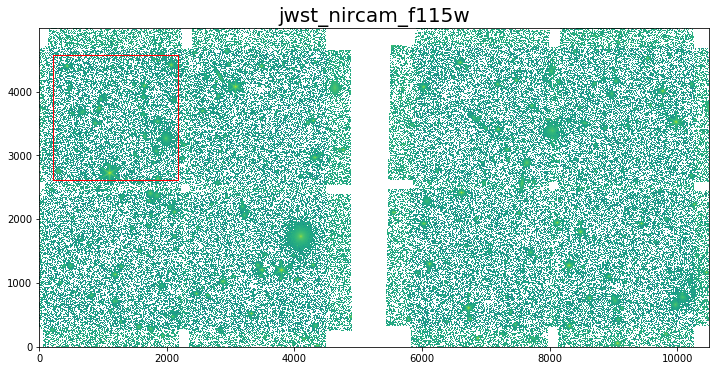

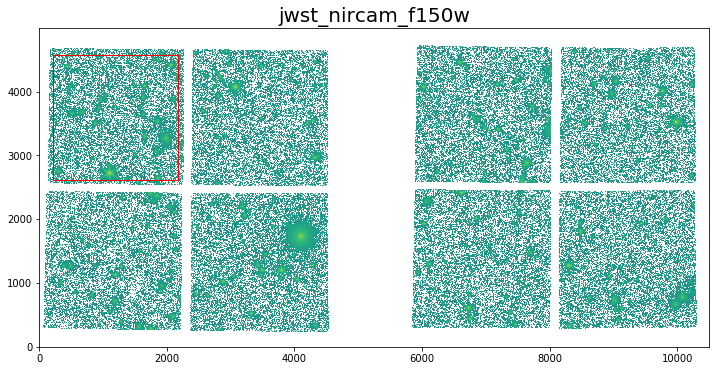

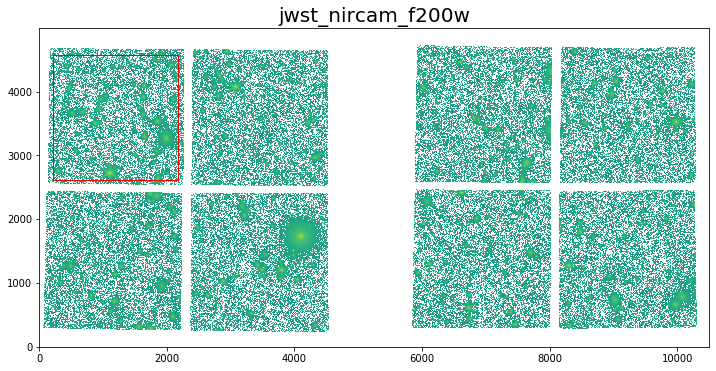

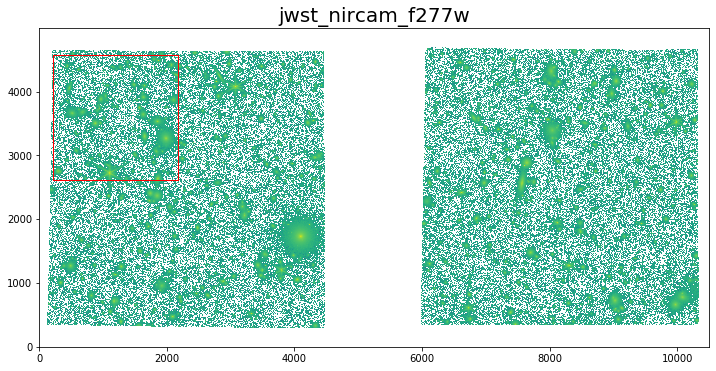

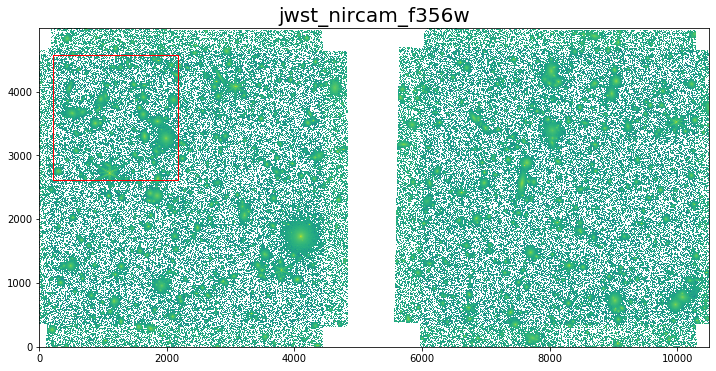

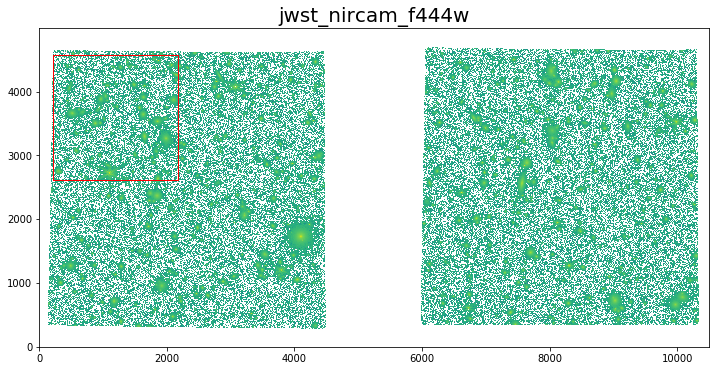

In [5]:
for i in range(0,nbands):
    hdu = fits.open(data_dir+sci_img[i])
    data_img = hdu['SCI'].data
    hdu.close()
    
    fig1 = plt.figure(figsize=(12,6))
    f1 = plt.subplot()
    plt.title('%s' % filters[i], fontsize=20)
    plt.imshow(np.log10(data_img), origin='lower')
    
    xmin, xmax = 220, 2180
    ymin, ymax = 2620, 4580
    
    x = np.linspace(xmin,xmax,100)
    y = ymin + x - x
    plt.plot(x,y,lw=1,color='red')
    y = ymax + x - x
    plt.plot(x,y,lw=1,color='red')
    
    y = np.linspace(ymin,ymax,100)
    x = xmin + y - y
    plt.plot(x,y,lw=1,color='red')
    x = xmax + y - y
    plt.plot(x,y,lw=1,color='red')

In [6]:
x_cent, y_cent = xmin+(0.5*(xmax-xmin)), ymin+(0.5*(ymax-ymin))
print (x_cent, y_cent)
crop_size = [ymax-ymin+1, xmax-xmin+1]
print (crop_size)

1200.0 3600.0
[1961, 1961]


In [8]:
from astropy.wcs import WCS
from astropy.nddata import Cutout2D

for i in range(0,nbands):
    
    # crop science image
    hdu = fits.open(data_dir+sci_img[i])[1]
    wcs = WCS(hdu.header)
    position = (x_cent,y_cent)
    cutout = Cutout2D(hdu.data, position=position, size=crop_size, wcs=wcs)
    name_out = 'crop1_%s' % sci_img[i]
    fits.writeto(name_out, cutout.data, cutout.wcs.to_header(), overwrite=True)
    print ("[produce %s]" % name_out)
    
    # crop uncertainty image and produce variance image
    hdu = fits.open(data_dir+err_img[i])[2]
    wcs = WCS(hdu.header)
    position = (x_cent,y_cent)
    cutout = Cutout2D(hdu.data, position=position, size=crop_size, wcs=wcs)
    name_out = 'crop1_var_%s' % err_img[i]
    fits.writeto(name_out, np.square(cutout.data), cutout.wcs.to_header(), overwrite=True)
    print ("[produce %s]" % name_out)

[produce crop1_ceers5_f115w_sci.fits.gz]
[produce crop1_var_ceers5_f115w_err.fits.gz]
[produce crop1_ceers5_f150w_sci.fits.gz]
[produce crop1_var_ceers5_f150w_err.fits.gz]
[produce crop1_ceers5_f200w_sci.fits.gz]
[produce crop1_var_ceers5_f200w_err.fits.gz]
[produce crop1_ceers5_f277w_sci.fits.gz]
[produce crop1_var_ceers5_f277w_err.fits.gz]
[produce crop1_ceers5_f356w_sci.fits.gz]
[produce crop1_var_ceers5_f356w_err.fits.gz]
[produce crop1_ceers5_f444w_sci.fits.gz]
[produce crop1_var_ceers5_f444w_err.fits.gz]


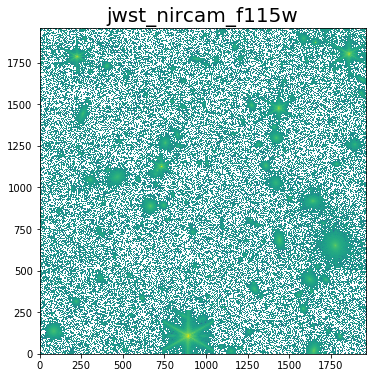

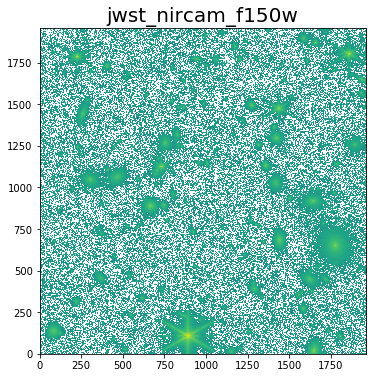

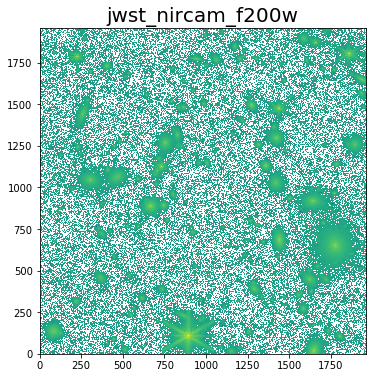

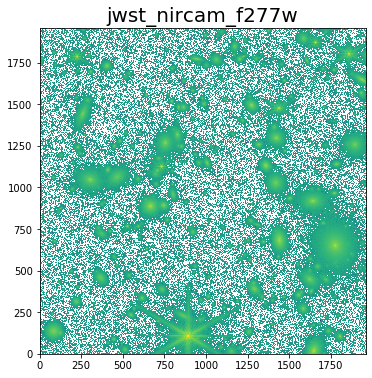

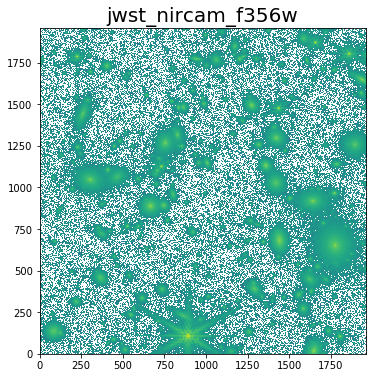

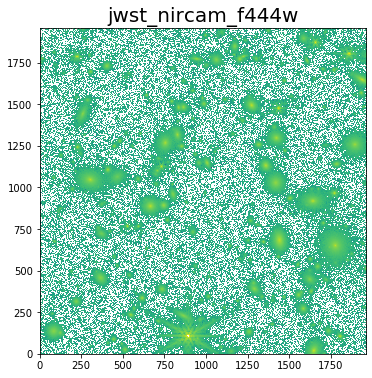

In [9]:
# check cropped science image
for i in range(0,nbands):
    hdu = fits.open('crop1_%s' % sci_img[i])
    data_img = hdu[0].data
    hdu.close()
    
    fig1 = plt.figure(figsize=(12,6))
    f1 = plt.subplot()
    plt.title('%s' % filters[i], fontsize=20)
    plt.imshow(np.log10(data_img), origin='lower')

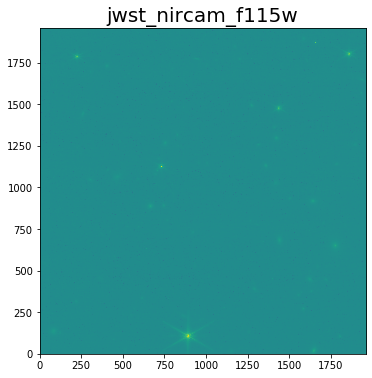

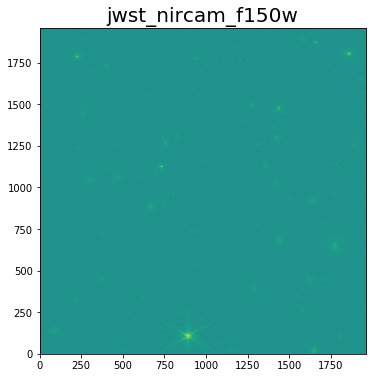

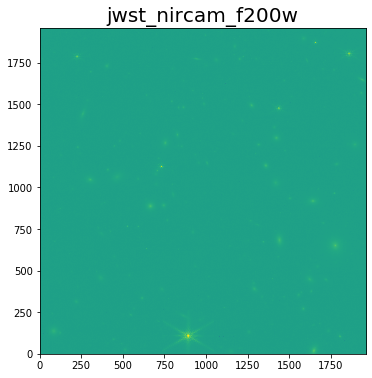

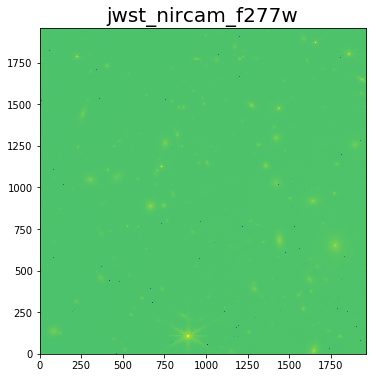

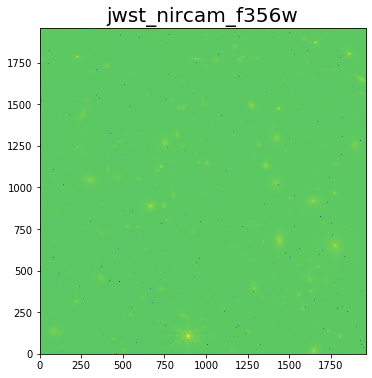

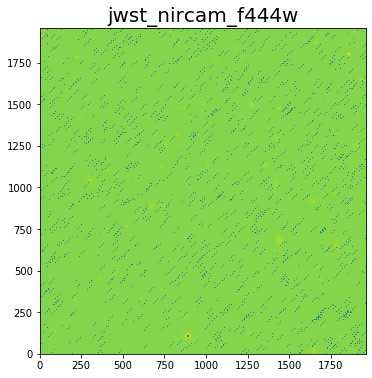

In [10]:
# check cropped variance image
for i in range(0,nbands):
    hdu = fits.open('crop1_var_%s' % err_img[i])
    data_img = hdu[0].data
    hdu.close()
    
    fig1 = plt.figure(figsize=(12,6))
    f1 = plt.subplot()
    plt.title('%s' % filters[i], fontsize=20)
    plt.imshow(np.log10(data_img), origin='lower')

### Crop region 2

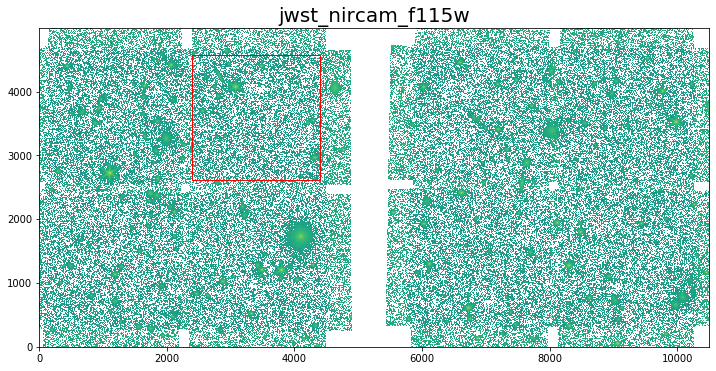

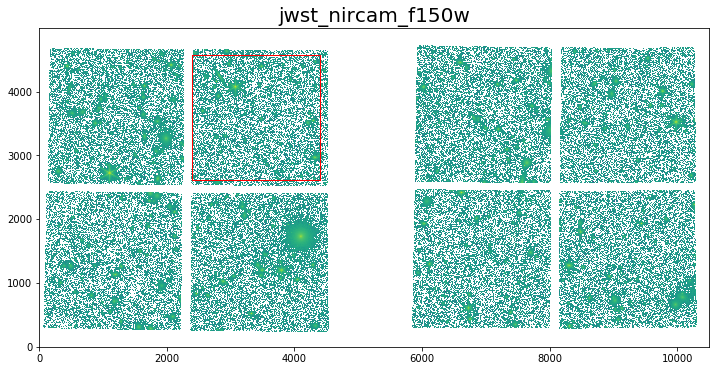

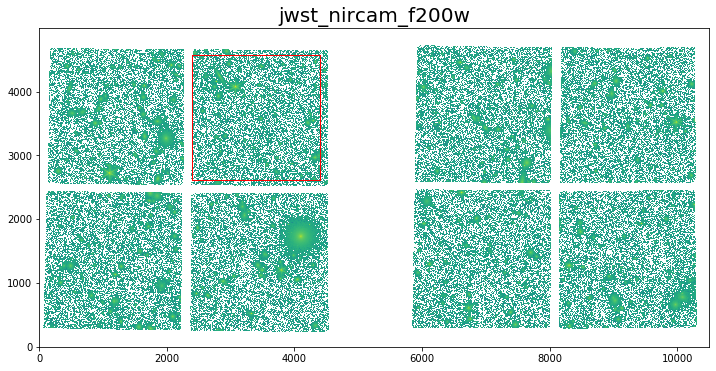

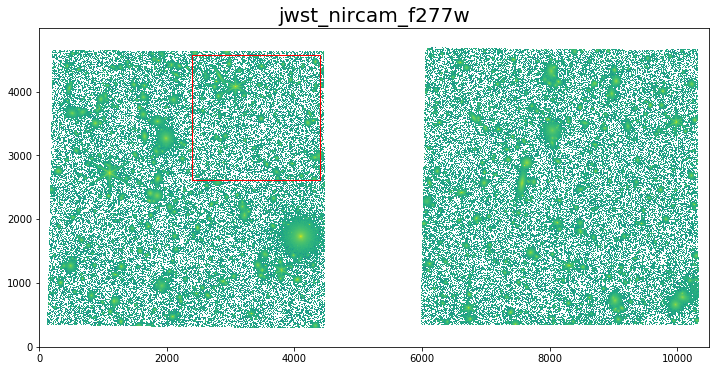

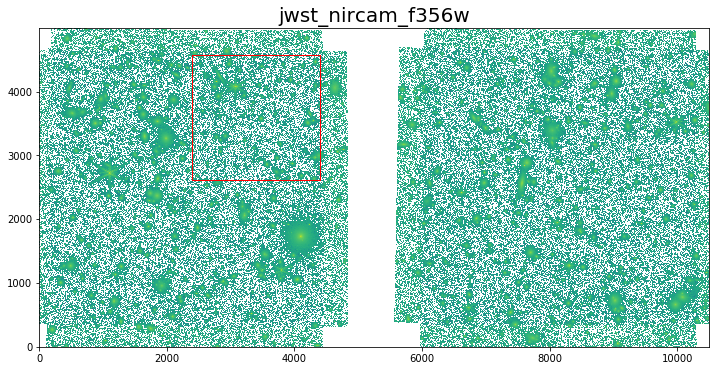

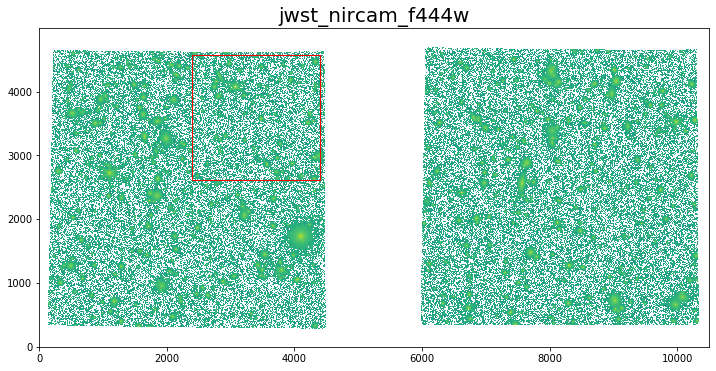

In [14]:
for i in range(0,nbands):
    hdu = fits.open(data_dir+sci_img[i])
    data_img = hdu['SCI'].data
    hdu.close()
    
    fig1 = plt.figure(figsize=(12,6))
    f1 = plt.subplot()
    plt.title('%s' % filters[i], fontsize=20)
    plt.imshow(np.log10(data_img), origin='lower')
    
    xmin, xmax = 2400, 4400
    ymin, ymax = 2620, 4580
    
    x = np.linspace(xmin,xmax,100)
    y = ymin + x - x
    plt.plot(x,y,lw=1,color='red')
    y = ymax + x - x
    plt.plot(x,y,lw=1,color='red')
    
    y = np.linspace(ymin,ymax,100)
    x = xmin + y - y
    plt.plot(x,y,lw=1,color='red')
    x = xmax + y - y
    plt.plot(x,y,lw=1,color='red')

In [15]:
x_cent, y_cent = xmin+(0.5*(xmax-xmin)), ymin+(0.5*(ymax-ymin))
print (x_cent, y_cent)
crop_size = [ymax-ymin+1, xmax-xmin+1]
print (crop_size)

3400.0 3600.0
[1961, 2001]


In [16]:
from astropy.wcs import WCS
from astropy.nddata import Cutout2D

for i in range(0,nbands):
    
    # crop science image
    hdu = fits.open(data_dir+sci_img[i])[1]
    wcs = WCS(hdu.header)
    position = (x_cent,y_cent)
    cutout = Cutout2D(hdu.data, position=position, size=crop_size, wcs=wcs)
    name_out = 'crop2_%s' % sci_img[i]
    fits.writeto(name_out, cutout.data, cutout.wcs.to_header(), overwrite=True)
    print ("[produce %s]" % name_out)
    
    # crop uncertainty image and produce variance image
    hdu = fits.open(data_dir+err_img[i])[2]
    wcs = WCS(hdu.header)
    position = (x_cent,y_cent)
    cutout = Cutout2D(hdu.data, position=position, size=crop_size, wcs=wcs)
    name_out = 'crop2_var_%s' % err_img[i]
    fits.writeto(name_out, np.square(cutout.data), cutout.wcs.to_header(), overwrite=True)
    print ("[produce %s]" % name_out)

[produce crop2_ceers5_f115w_sci.fits.gz]
[produce crop2_var_ceers5_f115w_err.fits.gz]
[produce crop2_ceers5_f150w_sci.fits.gz]
[produce crop2_var_ceers5_f150w_err.fits.gz]
[produce crop2_ceers5_f200w_sci.fits.gz]
[produce crop2_var_ceers5_f200w_err.fits.gz]
[produce crop2_ceers5_f277w_sci.fits.gz]
[produce crop2_var_ceers5_f277w_err.fits.gz]
[produce crop2_ceers5_f356w_sci.fits.gz]
[produce crop2_var_ceers5_f356w_err.fits.gz]
[produce crop2_ceers5_f444w_sci.fits.gz]
[produce crop2_var_ceers5_f444w_err.fits.gz]


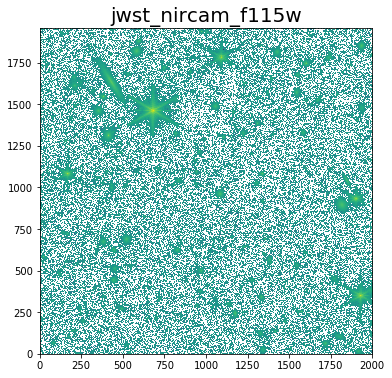

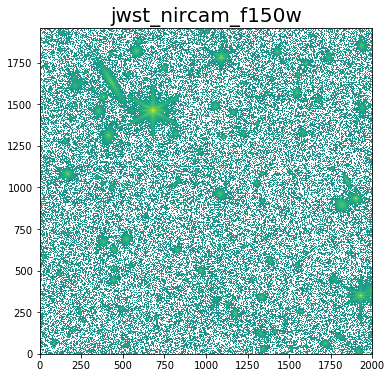

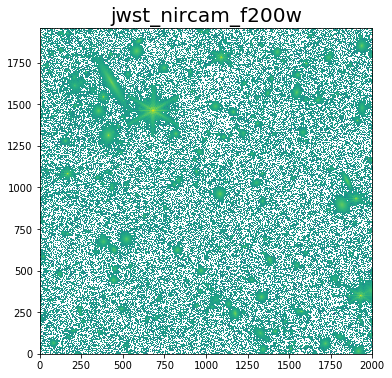

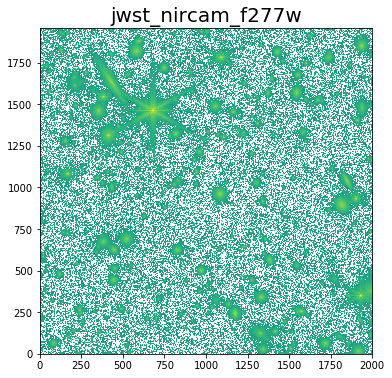

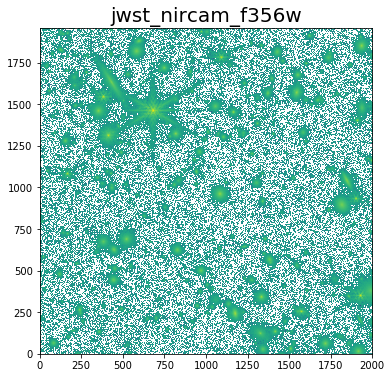

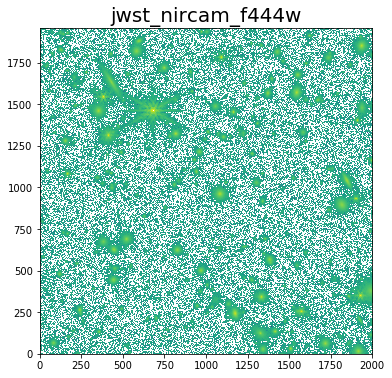

In [17]:
# check cropped science image
for i in range(0,nbands):
    hdu = fits.open('crop2_%s' % sci_img[i])
    data_img = hdu[0].data
    hdu.close()
    
    fig1 = plt.figure(figsize=(12,6))
    f1 = plt.subplot()
    plt.title('%s' % filters[i], fontsize=20)
    plt.imshow(np.log10(data_img), origin='lower')

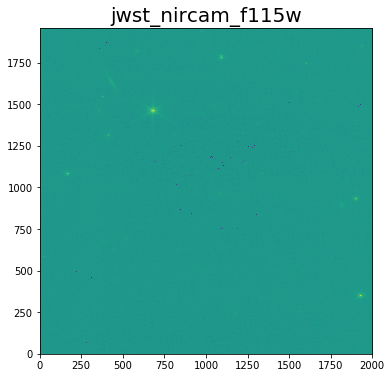

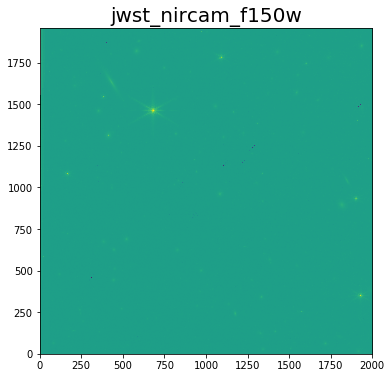

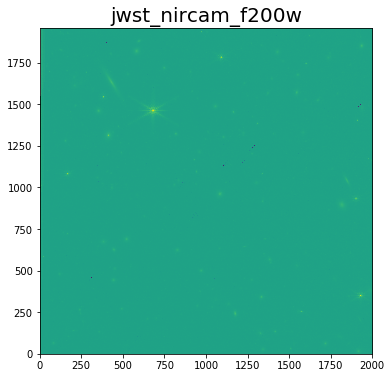

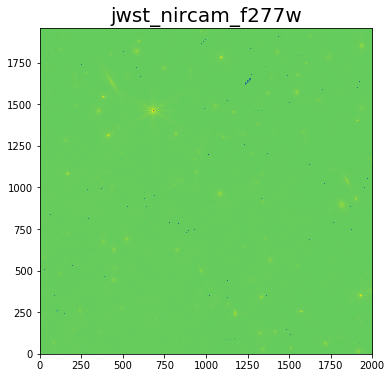

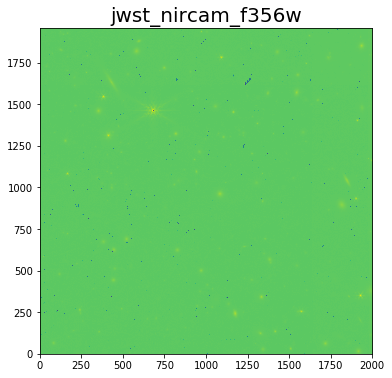

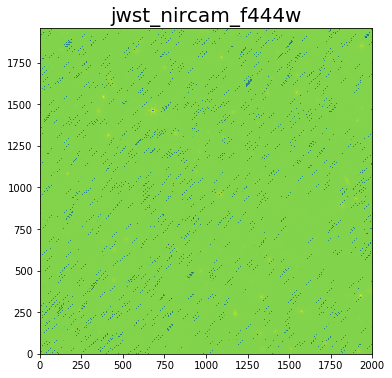

In [18]:
# check cropped variance image
for i in range(0,nbands):
    hdu = fits.open('crop2_var_%s' % err_img[i])
    data_img = hdu[0].data
    hdu.close()
    
    fig1 = plt.figure(figsize=(12,6))
    f1 = plt.subplot()
    plt.title('%s' % filters[i], fontsize=20)
    plt.imshow(np.log10(data_img), origin='lower')

## 1.2. PSF matching to match spatial resolution of F444W band

The PSF (point spread function or spatial resolution) size varies among filters. Before proceeding further with the aperture photometry, we need to bring all the images into the same spatial resolution. In this step, we will do PSF matching, which is a process of matching spatial resolution of multiband images.

PSF characteristics of NIRCam instrument: https://jwst-docs.stsci.edu/jwst-near-infrared-camera/nircam-performance/nircam-point-spread-functions

Commonly, PSF matching is done by convolving images with pre-calculated kernels. The kernels are calculated from model or empirical PSFs of the cameras. In this tutorial, we will be using kernels from https://www.astro.princeton.edu/~draine/Kernels/Kernels_JWST/Kernels_fits_Files/Hi_Resolution/ which were calculated using a technique described in [Aniano et al. (2011)](https://ui.adsabs.harvard.edu/abs/2011PASP..123.1218A/abstract).

In [27]:
dir_kernel = "../kernels/"
kernels = ['Kernel_HiRes_JWST_NIRCam_F115W_to_JWST_NIRCam_F444W.fits.gz',
           'Kernel_HiRes_JWST_NIRCam_F150W_to_JWST_NIRCam_F444W.fits.gz',
           'Kernel_HiRes_JWST_NIRCam_F200W_to_JWST_NIRCam_F444W.fits.gz',
           'Kernel_HiRes_JWST_NIRCam_F277W_to_JWST_NIRCam_F444W.fits.gz',
           'Kernel_HiRes_JWST_NIRCam_F356W_to_JWST_NIRCam_F444W.fits.gz']

### PSF matching for the cropped region 1

In [29]:
from astropy.convolution import convolve_fft
from photutils.psf.matching import resize_psf

pixsize = 0.03

for bb in range(0,nbands-1):
    # get kernel data
    hdu = fits.open(dir_kernel+kernels[bb])
    kernel_data = hdu[0].data
    pixscale = hdu[0].header['CD1_1']*3600.0
    hdu.close()
    
    # resize kernel
    kernel_resize = resize_psf(kernel_data, pixscale, pixsize, order=3)
    
    #==> science image
    name = 'crop1_%s' % sci_img[bb]
    hdu = fits.open(name)
    data_img = hdu[0].data
    header = hdu[0].header
    hdu.close()
    # PSF matching
    psfmatch_data_img = convolve_fft(data_img, kernel_resize, allow_huge=True)
    # write to FITS file
    name_out = 'psfmatch_%s' % name
    fits.writeto(name_out, psfmatch_data_img, header, overwrite=True)
        
    #==> variance image
    name = 'crop1_var_%s' % err_img[bb]
    hdu = fits.open(name)
    data_img = hdu[0].data
    header = hdu[0].header
    hdu.close()
    # PSF matching
    psfmatch_data_img = convolve_fft(data_img, kernel_resize, allow_huge=True)
    # write to FITS file
    name_out = 'psfmatch_%s' % name
    fits.writeto(name_out, psfmatch_data_img, header, overwrite=True)


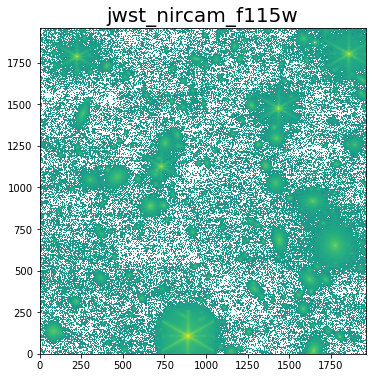

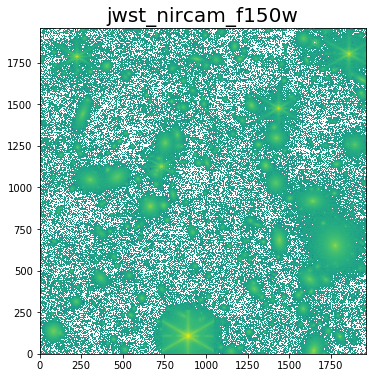

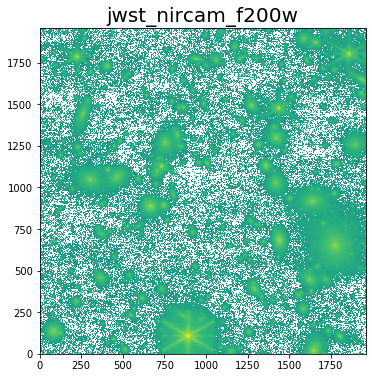

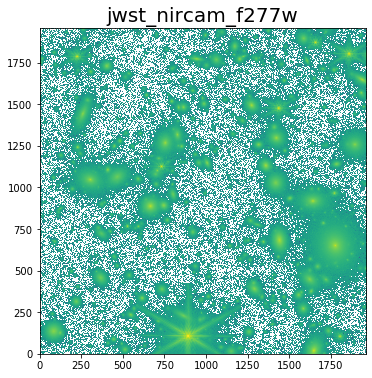

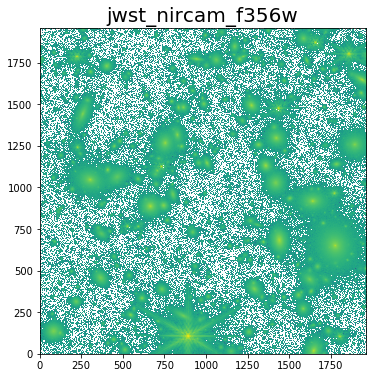

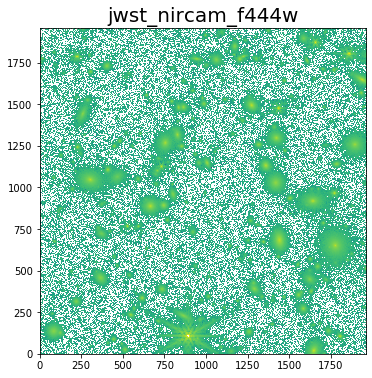

In [31]:
# check science image after PSF matching
for bb in range(0,nbands):
    if bb < nbands-1:
        name = 'psfmatch_crop1_%s' % sci_img[bb]
    else:
        name = 'crop1_%s' % sci_img[bb]
    hdu = fits.open(name)
    data_img = hdu[0].data
    hdu.close()
    
    fig1 = plt.figure(figsize=(12,6))
    f1 = plt.subplot()
    plt.title('%s' % filters[bb], fontsize=20)
    plt.imshow(np.log10(data_img), origin='lower')

### PSF matching for the cropped region 2

In [32]:
from astropy.convolution import convolve_fft
from photutils.psf.matching import resize_psf

pixsize = 0.03

for bb in range(0,nbands-1):
    # get kernel data
    hdu = fits.open(dir_kernel+kernels[bb])
    kernel_data = hdu[0].data
    pixscale = hdu[0].header['CD1_1']*3600.0
    hdu.close()
    
    # resize kernel
    kernel_resize = resize_psf(kernel_data, pixscale, pixsize, order=3)
    
    #==> science image
    name = 'crop2_%s' % sci_img[bb]
    hdu = fits.open(name)
    data_img = hdu[0].data
    header = hdu[0].header
    hdu.close()
    # PSF matching
    psfmatch_data_img = convolve_fft(data_img, kernel_resize, allow_huge=True)
    # write to FITS file
    name_out = 'psfmatch_%s' % name
    fits.writeto(name_out, psfmatch_data_img, header, overwrite=True)
        
    #==> variance image
    name = 'crop2_var_%s' % err_img[bb]
    hdu = fits.open(name)
    data_img = hdu[0].data
    header = hdu[0].header
    hdu.close()
    # PSF matching
    psfmatch_data_img = convolve_fft(data_img, kernel_resize, allow_huge=True)
    # write to FITS file
    name_out = 'psfmatch_%s' % name
    fits.writeto(name_out, psfmatch_data_img, header, overwrite=True)


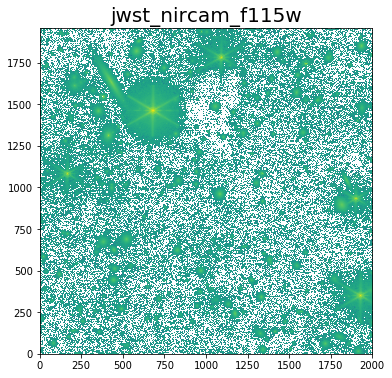

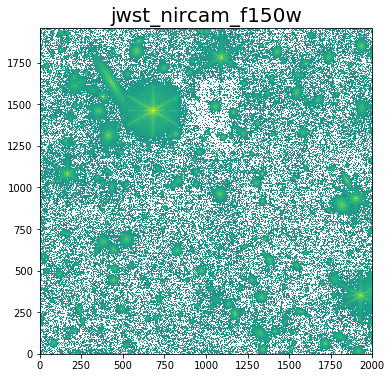

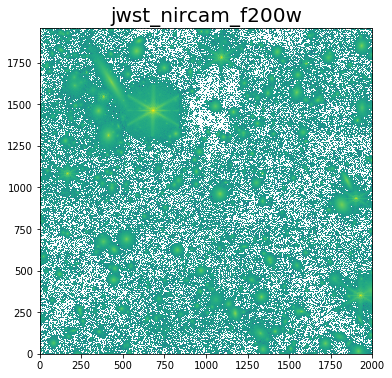

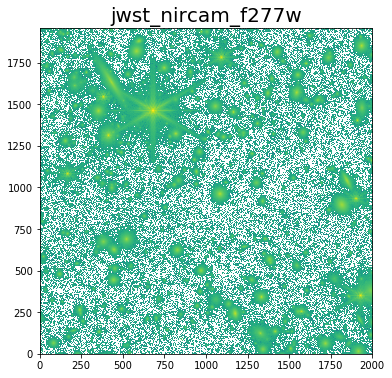

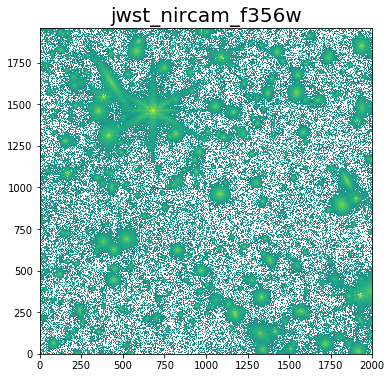

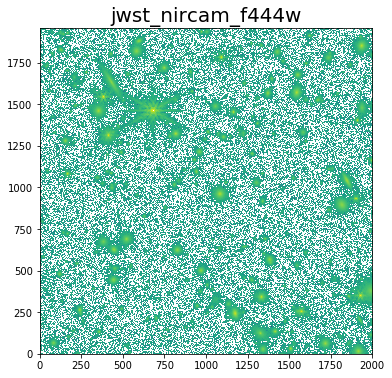

In [33]:
# check science image after PSF matching
for bb in range(0,nbands):
    if bb < nbands-1:
        name = 'psfmatch_crop2_%s' % sci_img[bb]
    else:
        name = 'crop2_%s' % sci_img[bb]
    hdu = fits.open(name)
    data_img = hdu[0].data
    hdu.close()
    
    fig1 = plt.figure(figsize=(12,6))
    f1 = plt.subplot()
    plt.title('%s' % filters[bb], fontsize=20)
    plt.imshow(np.log10(data_img), origin='lower')

## 1.3. Make RGB color image

This is an optional step and not related to aperture photometry. A color image shows a look as if we see it by eyes.  

### Make RGB color image for cropped region 1

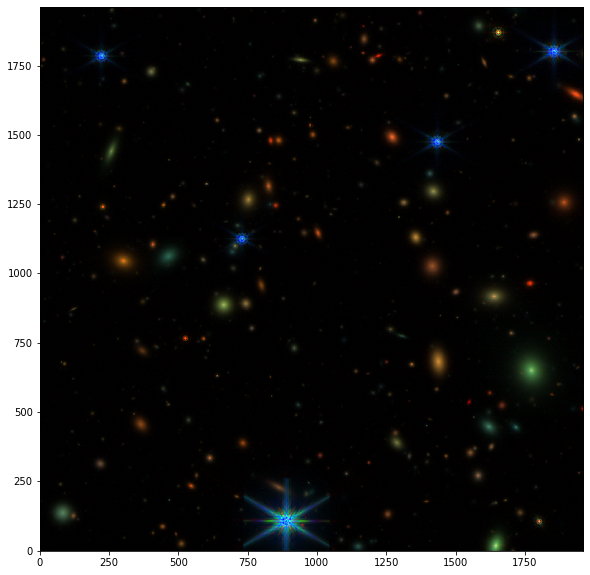

In [35]:
from astropy.visualization import make_lupton_rgb

b = 'psfmatch_crop1_ceers5_f115w_sci.fits.gz'
g = 'psfmatch_crop1_ceers5_f200w_sci.fits.gz'
r = 'crop1_ceers5_f444w_sci.fits.gz'

hdu = fits.open(b)
blue = hdu[0].data
hdu.close()

hdu = fits.open(g)
green = hdu[0].data
hdu.close()

hdu = fits.open(r)
red = hdu[0].data
hdu.close()

rgb = make_lupton_rgb(red, green, blue, Q=10, stretch=0.5)

fig = plt.figure(figsize=(10,10))
f1 = plt.subplot()
plt.setp(f1.get_yticklabels(), visible=False)
plt.setp(f1.get_xticklabels(), visible=False)
plt.imshow(rgb, origin='lower')

f1.text(0.05, 0.06, 'F115W', horizontalalignment='left', verticalalignment='center',
            transform = f1.transAxes, fontsize=12, color='blue',
       bbox = dict(facecolor ='white', alpha = 0.5))

f1.text(0.3, 0.06, 'F200W', horizontalalignment='left', verticalalignment='center',
            transform = f1.transAxes, fontsize=12, color='green',
       bbox = dict(facecolor ='white', alpha = 0.5))

f1.text(0.55, 0.06, 'F444W', horizontalalignment='left', verticalalignment='center',
            transform = f1.transAxes, fontsize=12, color='red',
       bbox = dict(facecolor ='white', alpha = 0.5))

plt.savefig('rgb_crop1.png')

### Make RGB color image for cropped region 2

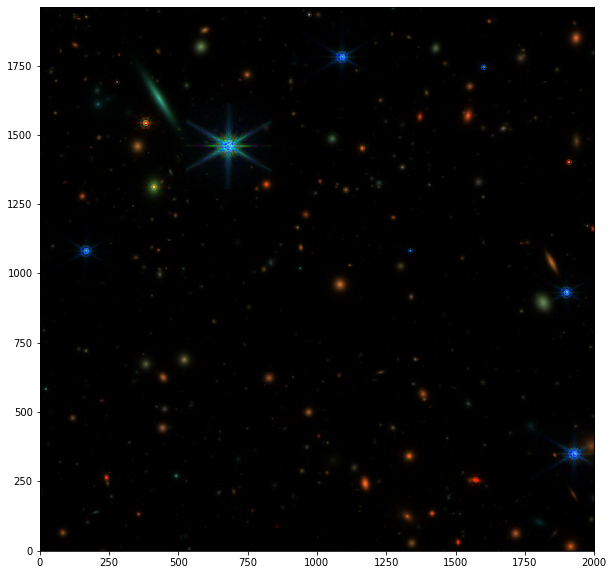

In [36]:
from astropy.visualization import make_lupton_rgb

b = 'psfmatch_crop2_ceers5_f115w_sci.fits.gz'
g = 'psfmatch_crop2_ceers5_f200w_sci.fits.gz'
r = 'crop2_ceers5_f444w_sci.fits.gz'

hdu = fits.open(b)
blue = hdu[0].data
hdu.close()

hdu = fits.open(g)
green = hdu[0].data
hdu.close()

hdu = fits.open(r)
red = hdu[0].data
hdu.close()

rgb = make_lupton_rgb(red, green, blue, Q=10, stretch=0.5)

fig = plt.figure(figsize=(10,10))
f1 = plt.subplot()
plt.setp(f1.get_yticklabels(), visible=False)
plt.setp(f1.get_xticklabels(), visible=False)
plt.imshow(rgb, origin='lower')

f1.text(0.05, 0.06, 'F115W', horizontalalignment='left', verticalalignment='center',
            transform = f1.transAxes, fontsize=12, color='blue',
       bbox = dict(facecolor ='white', alpha = 0.5))

f1.text(0.3, 0.06, 'F200W', horizontalalignment='left', verticalalignment='center',
            transform = f1.transAxes, fontsize=12, color='green',
       bbox = dict(facecolor ='white', alpha = 0.5))

f1.text(0.55, 0.06, 'F444W', horizontalalignment='left', verticalalignment='center',
            transform = f1.transAxes, fontsize=12, color='red',
       bbox = dict(facecolor ='white', alpha = 0.5))

plt.savefig('rgb_crop2.png')